In [43]:
import anndata
import numpy as np
import scipy as sp
import scvelo as scv
import scanpy as sc
import scFates as scf
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import os
import topovelo as tpv
import matplotlib.pyplot as plt

In [2]:
dataset = 'slide-seq-e9-nt'
DATA_DIR = ''
adata = anndata.read_h5ad(f"{DATA_DIR}/slide-seq-e9-nt-out.h5ad")
adata_meta = sc.read('')

# (Optional) 0. Remove the tail of neural tube for better visualization

In [4]:
x_spatial = adata.obsm['X_spatial_registered']
is_tail = (x_spatial[:, 1] >= -300*0.673) & (x_spatial[:, 2] <= 420)
adata = adata[~is_tail]

In [5]:
# adata.write_h5ad(f"{data_path_base}/output/slide-seq-e9-nt-filt_out.h5ad")

# 1. Find common barcodes

In [3]:
bcs = [x[:-2] for x in adata.obs_names]
bcs = pd.Index(np.intersect1d(bcs, adata_meta.obs_names))
adata_meta = adata_meta[bcs]

Put all results into a DataFrame

In [4]:
x_spatial = adata.obsm['X_spatial_registered']
adata.obsm['X_spatial'] =  np.stack([x_spatial[:, 1], -x_spatial[:, 0], -x_spatial[:, 2]]).T
df = pd.DataFrame(x_spatial,
                  index=adata.obs.index,
                  columns=['x', 'y', 'z'])
df['clusters'] = adata.obs['cell_state'].to_numpy()
df['time'] = adata.obs['gat_time'].to_numpy()
df.head()

,x,y,z,clusters,time
Puck_220718_32_GAGAGACACCAATC-1-0,438.798783,-444.950373,420.0,Brain,3.684631
Puck_220718_32_CTTGAACGGTATCT-1-0,109.302214,-1167.449874,420.0,Brain,3.789909
Puck_220718_32_CTACACCCTTCCCT-1-0,263.725206,-444.930935,420.0,Neural tube,3.652594
Puck_220718_32_GCGGATCGCTGTCG-1-0,351.664955,-489.678324,420.0,Brain,3.629430
Puck_220718_32_GCCGTGGNCCCTGG-1-0,392.559184,-706.980204,420.0,Brain,3.763241


# 2.1 3D interactive plot of neural tube with cell type annotation

In [5]:
x_spatial = adata.obsm['X_spatial_registered']
cell_labels = adata.obs['cell_state'].to_numpy()
fig = go.Figure()
traces = []
for i, cell_type in enumerate(df['clusters'].unique()):
    mask = cell_labels == cell_type
    trace = go.Scatter3d(x=x_spatial[mask, 0], y=x_spatial[mask, 1], z=x_spatial[mask, 2],
                         marker=dict(
                             size=2,
                             opacity=0.8
                         ),
                         mode='markers',
                         name=cell_type,
                         showlegend=True)
    fig.add_trace(trace)
fig.update_layout(
    showlegend=True,
    #legend=dict(),
    legend=go.layout.Legend(
        itemsizing='constant',
        font=dict(size=20)
    ),
    width=8*96,
    height=8*96
)
fig.show()  

# 2.2 Interactive 3D plot of cell cluster and time

In [7]:
fig = make_subplots(
    rows=1, 
    cols=2,
    start_cell="top-left", 
    specs=[
        [{"type": "scatter3d"}, {"type": "scatter3d"}]
    ]
)
traces = []
tmax, tmin = df['time'].max(), df['time'].min()
for i, cell_type in enumerate(df['clusters'].unique()):
    mask = df['clusters'] == cell_type
    trace = go.Scatter3d(x=df['x'][mask], y=df['y'][mask], z=df['z'][mask],
                         marker=dict(
                             size=3,
                             opacity=0.8
                         ),
                         mode='markers',
                         name=cell_type,
                         showlegend=True)
    fig.add_trace(trace, row=1, col=1)
trace = go.Scatter3d(x=df['x'], y=df['y'], z=df['z'],
                     marker=dict(
                         size=2,
                         color=df['time'],
                         colorscale='Viridis',
                         cmax=tmax,
                         cmin=tmin,
                         opacity=0.8
                     ),
                     name='Cell Time',
                     mode='markers',
                     showlegend=True)
fig.add_trace(trace, row=1, col=2)
fig.update_layout(
    showlegend=True,
    #legend=dict(),
    legend=go.layout.Legend(
        itemsizing='constant',
        font=dict(size=20)
    ),
    width=12*96,
    height=6*96
)
fig.show()

# 3 Cell Velocity Quiver Plot

In [10]:
vkey = 'gat_velocity'
n_jobs = 4
scv.pp.neighbors(adata, n_neighbors=30, use_rep='spatial_registered', method='sklearn')
scv.tl.velocity_graph(adata, vkey=vkey, n_jobs=n_jobs)
scv.tl.velocity_embedding(adata, vkey=vkey, basis='spatial_registered')

computing neighbors
    finished (0:00:03) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing velocity graph (using 4/36 cores)


  0%|          | 0/10432 [00:00<?, ?cells/s]

    finished (0:00:28) --> added 
    'gat_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:02) --> added
    'gat_velocity_spatial_registered', embedded velocity vectors (adata.obsm)


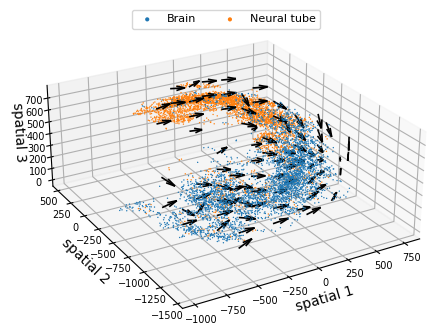

In [11]:
x_spatial = adata.obsm['X_spatial_registered']
v = adata.obsm['gat_velocity_spatial_registered']
v[np.isnan(v)] = 0.0

x_grid, v_grid = tpv.plotting.plot_trajectory_4d(
    x_spatial,
    v,
    adata.obs['cell_state'].to_numpy(),
    100,
    scale=1.35,
    smooth_factor=4e-3,
    angle=(25, -120),
    figsize=(8/2.54, 8/2.54),
    plot_arrow=True,
    n_grid=7,
    ncol=2,
    arrow_length=120.0,
    arrow_length_ratio=0.6,
    legend_fontsize=8,
    tick_fontsize=7,
    label_fontsize=10,
    markersize=1,
    markerscale=3,
    linewidth=1.2,
    labelpad=(-10, -10, -12),
    tick_labelpad=-4,
    #real_aspect_ratio=False,
    bbox_to_anchor=(0.0, 1.0, 1.0, 0.1),
    zoom=1.5
)

# 4 Marker gene heatmap

In [21]:
def plot_marker_genes(adata_meta, genes, figure_path, cut_off=None):
    for gene in genes:
        gidx = np.where(adata_meta.var_names == gene)[0]
        if len(gidx) == 0:
            continue

        gidx = gidx[0]
        expr = adata_meta.X[:, gidx]
        # cutoff extreme values
        if cut_off is not None:
            expr = np.clip(expr, None, np.quantile(expr, cut_off))
        save = None if figure_path is None else f"{figure_path}/{gene}.png"
        tpv.plotting.plot_3d_heatmap(expr,
                                     x_spatial,
                                     figsize=(6/2.54, 6/2.54),
                                     angle=(25, -120),
                                     colorbar_name='Expression',
                                     markersize=1.0,
                                     colorbar_fontsize=7,
                                     colorbar_ticklabels=['min', 'max'],
                                     colorbar_limits=[expr.min(), expr.max()],
                                     colorbar_ticks=[expr.min(), expr.max()],
                                     colorbar_tick_fontsize=5,
                                     real_aspect_ratio=True,
                                     cmap='YlOrRd_r',
                                     show_background=True,
                                     show_colorbar=False,
                                     colorbar_pos=[1.0, 0.2, 0.05, 0.6],
                                     zoom=1,
                                     axis_off=False,
                                     label_off=True,
                                     ticks_off=True,
                                     save=save)

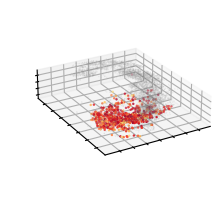

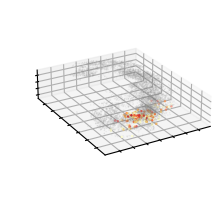

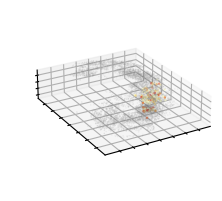

In [22]:
x_spatial = adata_meta.obsm['X_spatial_registered']
plot_marker_genes(adata_meta, ['Otx2', 'En1', 'Egr2'], None)

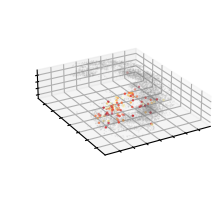

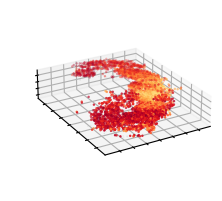

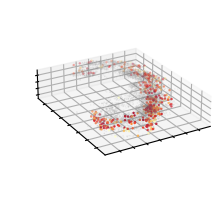

In [23]:
x_spatial = adata_meta.obsm['X_spatial_registered']
plot_marker_genes(adata_meta, ['Six3os1', 'Crabp1', 'Pax3'], None)

# 5. Principal Curves
## 5.1 Calculate a principal curve

In [24]:
scf.tl.curve(adata,
             Nodes=30,
             use_rep="X_spatial_registered",
             basis="spatial_registered",
             epg_mu=1.0,
             epg_lambda=0.01,
             ndims_rep=3,
             epg_verbose=False,
             seed=42)

inferring a principal curve --> parameters used 
    30 principal points, mu = 1.0, lambda = 0.01
    finished (0:00:02) --> added 
    .uns['epg'] dictionnary containing inferred elastic curve generated from elpigraph.
    .obsm['X_R'] soft assignment of cells to principal points.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['F'], coordinates of principal points in representation space.


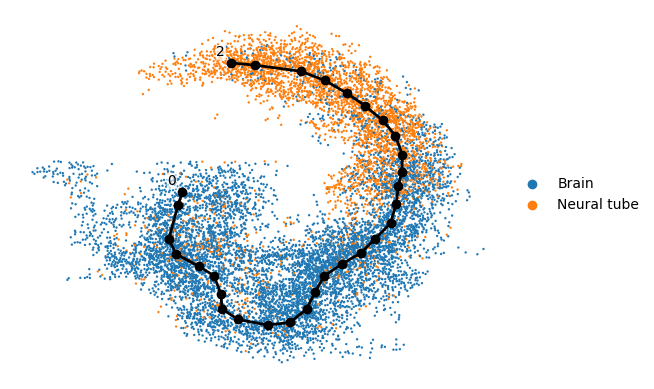

In [25]:
scf.pl.graph(adata,
             basis="spatial_registered",
             color_cells='cell_state',
             title="",
             frameon=False)

In [26]:
scf.pl.trajectory_3d(adata, basis='spatial_registered')

## 5.2 Sort anchor points

In [27]:
anchors = np.stack(adata.uns['graph']['F']).T

In [28]:
def sort_anchor(edges, end_points, t, anchors):
    n_node = edges.shape[0] + 1
    # start and end only appear once
    record = [[] for i in range(n_node)]
    for edge in edges:
        record[edge[0]].append(edge[1])
        record[edge[1]].append(edge[0])
    
    t_1 = np.median(t[anchors == end_points[0]])
    t_2 = np.median(t[anchors == end_points[1]])
    if t_1 < t_2:
        start = end_points[0]
        end = end_points[1]
    else:
        start = end_points[1]
        end = end_points[0]
    anchors_ordered = [start]
    count = 1
    ptr = start
    prev = start
    while(count < n_node - 1):
        for nbs in record[ptr]:
            if nbs != prev:
                anchors_ordered.append(nbs)
                prev = ptr
                ptr = nbs
                count += 1
                break
    anchors_ordered.append(end)
    assert len(anchors_ordered) == n_node
    return np.array(anchors_ordered)

In [29]:
x_spatial = adata.obsm['X_spatial_registered']

anchor_spatial = adata.uns['epg']['NodePositions']
anchor_assign = np.argmax(adata.obsm["X_R"], 1)
x_projected = adata.uns['epg']['projection']['X_projected']
edges = adata.uns['epg']['Edges'][0]
end_points = np.where(adata.uns['epg']['Edges'][2] == 0)[0]
anchors_ordered = sort_anchor(edges, end_points, adata.obs['gat_time'].to_numpy(), anchor_assign)
anchor_spatial_ordered = anchor_spatial[anchors_ordered]

## 5.3 Unroll the neural tube

In [30]:
def cart2spherical(x, y, z):
    r = np.linalg.norm(np.stack([x, y, z]).T, axis=1)
    r_xy = np.linalg.norm(np.stack([x, y]).T, axis=1)
    phi = np.arccos(z/(r+(r==0))) # 0 to pi
    theta = np.arctan2(y, x) # -pi to pi
    
    return r, phi, theta

def spherical2cart(r, phi, theta):
    x = r*np.sin(phi)*np.cos(theta)
    y = r*np.sin(phi)*np.sin(theta)
    z = r*np.cos(phi)
    return x, y, z
    

def curve2tube(x_spatial,
               anchor_assign,
               anchors,
               anchor_x,
               anchor_y, anchor_z, plane='xy'):
    n_anchor = len(anchor_x)
    x_trans = np.zeros_like(x_spatial)
    curve_trans = np.zeros((n_anchor, 3))
    anchor_x_trans = 0
    anchor_y_trans = 0
    anchor_z_trans = 0
    for i, anchor in enumerate(anchors):
        curve_trans[i] = np.array([anchor_x_trans, anchor_y_trans, anchor_z_trans])
        # spherical coord of the plane normal vector
        if i < n_anchor - 1:
            r_v, phi_v, theta_v = cart2spherical(anchor_x[[anchors[i+1]]] - anchor_x[[anchor]],
                                                 anchor_y[[anchors[i+1]]] - anchor_y[[anchor]],
                                                 anchor_z[[anchors[i+1]]] - anchor_z[[anchor]]) 
        mask = anchor_assign == anchor
        # displacement from anchor point to all points assigned to it
        r, phi, theta = cart2spherical(x_spatial[mask, 0] - anchor_x[anchor],
                                       x_spatial[mask, 1] - anchor_y[anchor],
                                       x_spatial[mask, 2] - anchor_z[anchor])
        # Rotation
        if plane == 'xy':
            xi, yi, zi = spherical2cart(r, phi - phi_v, theta)
            delta_next = spherical2cart(np.array([r_v]),
                                               np.array([0]),
                                               np.array([theta_v]))
        elif plane == 'yz':
            xi, yi, zi = spherical2cart(r, phi + (np.pi/2 - phi_v), theta - theta_v)
            delta_next = spherical2cart(np.array([r_v]),
                                        np.array([np.pi/2]),
                                        np.array([0]))
        elif plane == 'zx':
            xi, yi, zi = spherical2cart(r, phi + (np.pi/2 - phi_v), theta + (np.pi/2 - theta_v))
            delta_next = spherical2cart(np.array([r_v]),
                                        np.array([np.pi/2]),
                                        np.array([np.pi/2]))
        
        x_trans[mask] = np.stack([xi + anchor_x_trans,
                                  yi + anchor_y_trans,
                                  zi + anchor_z_trans]).T
        anchor_x_trans = delta_next[0][0,0] + anchor_x_trans
        anchor_y_trans = delta_next[1][0,0] + anchor_y_trans
        anchor_z_trans = delta_next[2][0,0] + anchor_z_trans
    
    return x_trans, curve_trans

(None, None)

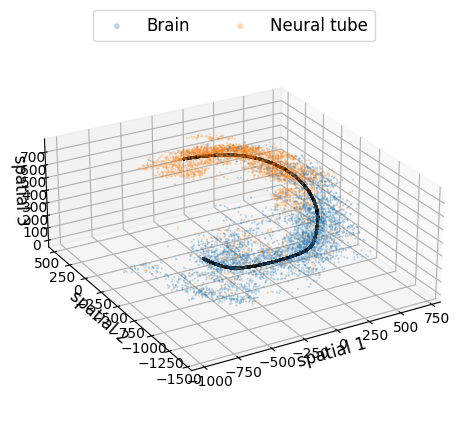

In [31]:
adata.obs['anchor'] = np.argmax(adata.obsm["X_R"], 1)
tpv.plotting.plot_trajectory_4d(x_spatial,
                                None,
                                adata.obs['cell_state'],
                                50,
                                figsize=(4.5, 7.5),
                                angle=(25, -120),
                                principal_curve=x_projected,
                                plot_anchors=False,
                                alpha=0.3,
                                real_aspect_ratio=True,
                                markerscale=3,
                                markersize=2,
                                ncol=10,
                                save=None)

In [32]:
x_trans, curve_trans = curve2tube(x_spatial,
                                  anchor_assign,
                                  anchors_ordered,
                                  anchor_spatial[:, 0],
                                  anchor_spatial[:, 1],
                                  anchor_spatial[:, 2],
                                  plane='zx')

In [33]:
df_tube = pd.DataFrame(data=x_trans, index=adata.obs.index, columns=['x', 'y', 'z'])
df_tube['anchor'] = adata.obs['anchor'].to_numpy()
df_tube.head()

,x,y,z,anchor
Puck_220718_32_GAGAGACACCAATC-1-0,-1.884112,1036.557603,-21.481607,23
Puck_220718_32_CTTGAACGGTATCT-1-0,-78.235407,1815.860563,39.650942,16
Puck_220718_32_CTACACCCTTCCCT-1-0,171.288132,1076.596856,17.754297,23
Puck_220718_32_GCGGATCGCTGTCG-1-0,78.746155,1116.808644,17.936825,4
Puck_220718_32_GCCGTGGNCCCTGG-1-0,-29.069227,1309.185327,45.275671,27


In [35]:
df_tube.to_csv(f'nt_transformed.csv')

In [35]:
df_anchor = pd.DataFrame(data=curve_trans, columns=['x', 'y', 'z'])
#df_anchor.to_csv('anchor.csv')
df_anchor.head()

,x,y,z
0,0.000000e+00,0.000000,0.000000e+00
1,7.308789e-15,119.361578,7.308789e-15
2,1.428305e-14,233.259874,1.428305e-14
3,2.082343e-14,340.072351,2.082343e-14
4,2.708568e-14,442.342711,2.708568e-14


(None, None)

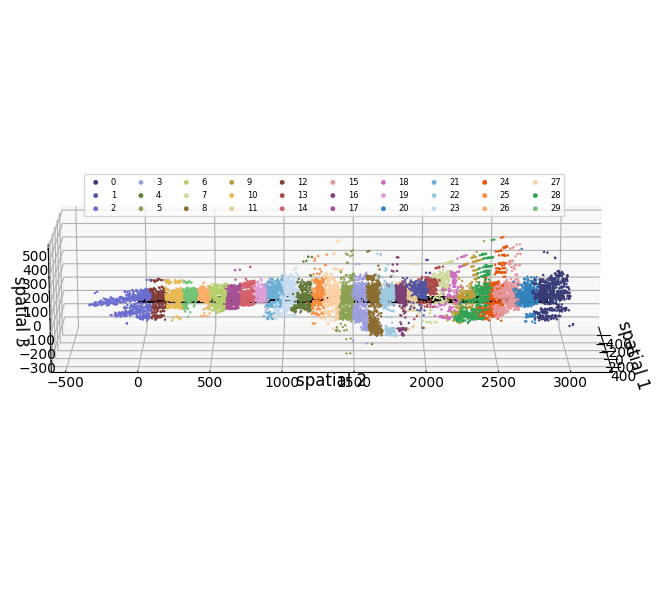

In [36]:
adata.obs['anchor'] = np.argmax(adata.obsm["X_R"], 1)
tpv.plotting.set_dpi(300)
tpv.plotting.plot_trajectory_4d(x_trans,
                                None,
                                adata.obs['anchor'],
                                50,
                                curve_trans,
                                angle=(15, 0),
                                ncol=10,
                                real_aspect_ratio=True,
                                legend_fontsize=6,
                                bbox_to_anchor=(0.0, 0.7, 1.0, -0.05),
                                save=None)

In [37]:
adata.obsm['X_tube'] = df_tube[['x', 'y', 'z']].values
adata.uns['unrolled_principal_curve'] = curve_trans

## 5.4 Calculate cell velocity on unrolled neural tube.

In [62]:
scv.pp.neighbors(adata, n_neighbors=30, use_rep='X_tube', method='sklearn')
scv.tl.velocity_graph(adata, vkey='gat_velocity')
scv.tl.velocity_embedding(adata, vkey='gat_velocity', basis='tube')

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing velocity graph (using 1/32 cores)


  0%|          | 0/10432 [00:00<?, ?cells/s]

    finished (0:00:05) --> added 
    'gat_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:01) --> added
    'gat_velocity_tube', embedded velocity vectors (adata.obsm)


In [63]:
df_tube[['vx', 'vy', 'vz']] = adata.obsm['gat_velocity_tube']
df_tube['v_ap'] = adata.obsm['gat_velocity_tube'][:, 1]
df_tube['v_dv'] = adata.obsm['gat_velocity_tube'][:, 0]
df_tube['v_lr'] = adata.obsm['gat_velocity_tube'][:, 2]

## 5.5 2D quiver plot along each axis

In [16]:
FIG_DIR = ''

In [69]:
adata.obsm['X_tube_xy'] = np.stack(
    [
        -adata.obsm['X_tube'][:, 1],
        adata.obsm['X_tube'][:, 0]
    ]
).T
adata.obsm['gat_velocity_tube_xy'] = np.stack(
    [np.zeros((adata.n_obs,)),
     adata.obsm['gat_velocity_tube'][:, 0]]
).T
# Prevent recalculating cell velocity in both directions.
adata.uns['gat_velocity_params']['embeddings'].append('tube_xy')


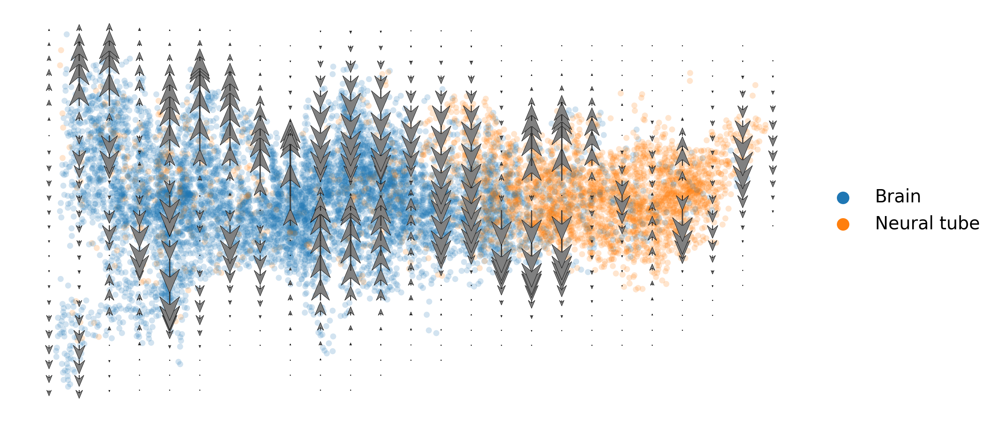

In [70]:
scv.pl.velocity_embedding_grid(
    adata,
    vkey='gat_velocity',
    basis='tube_xy',
    color='cell_state',
    figsize=(8, 4),
    title='',
    legend_loc='right margin',
    arrow_size=5.0,
    density=0.5,
    smooth=1.0,
    dpi=300
)

In [71]:
adata.obsm['X_tube_xy'] = np.stack(
    [
        -adata.obsm['X_tube'][:, 1],
        adata.obsm['X_tube'][:, 2]
    ]
).T
adata.obsm['gat_velocity_tube_xy'] = np.stack(
     [
         -adata.obsm['gat_velocity_tube'][:, 1],
         np.zeros((adata.n_obs,))
     ]
).T

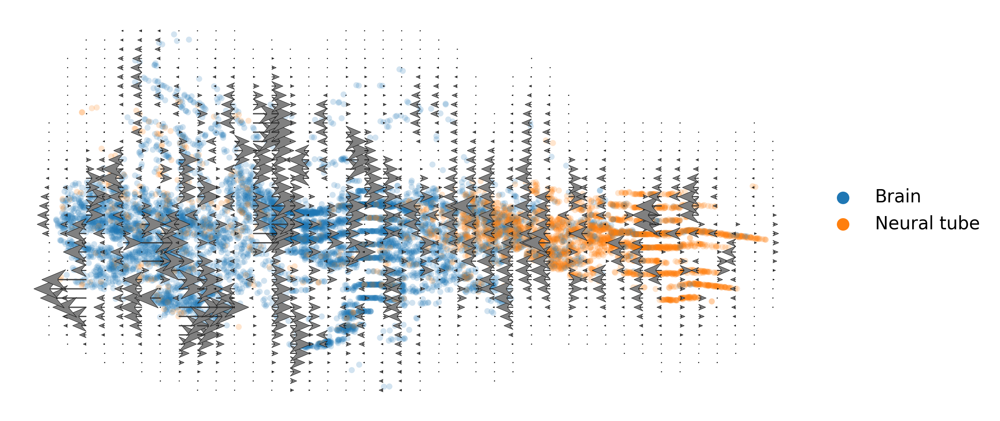

In [72]:
figsize = tpv.plotting.compute_figsize(
    adata.obsm['X_tube_xy'],
    height=4,
    width=8,
    real_aspect_ratio=False,
    fix='height',
    margin=0.0
)
scv.pl.velocity_embedding_grid(
    adata,
    basis='tube_xy',
    vkey='gat_velocity',
    color='cell_state',
    figsize=figsize,
    title='',
    legend_loc='right margin',
    arrow_size=5.0,
    arrow_length=2,
    density=0.8,
    smooth=1.0,
    n_neighbors=5,
    dpi=300
)

In [73]:
adata.obsm['X_tube_yz'] = np.stack(
    [
        -adata.obsm['X_tube'][:, 1],
        adata.obsm['X_tube'][:, 2]
    ]
).T
adata.obsm['gat_velocity_tube_yz'] = np.stack(
    [
        np.zeros((adata.n_obs,)),
        adata.obsm['gat_velocity_tube'][:, 2]
    ]
).T
# Prevent recalculating cell velocity in both directions.
adata.uns['gat_velocity_params']['embeddings'].append('tube_yz')

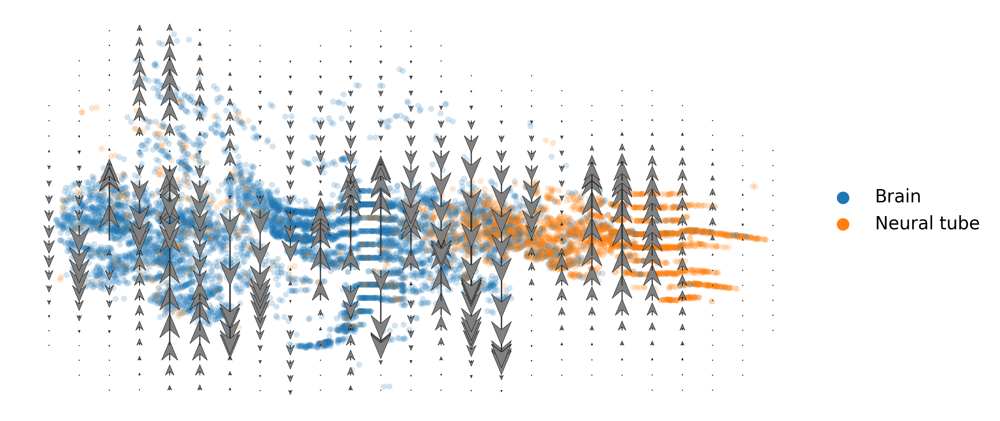

In [74]:
scv.pl.velocity_embedding_grid(
    adata,
    basis='tube_yz',
    vkey='gat_velocity',
    color='cell_state',
    figsize=figsize,
    title='',
    legend_loc='right margin',
    arrow_size=5.0,
    density=0.5,
    smooth=1.0,
    dpi=300
)

Heatmap showing velocity magnitude and direction

In [75]:
adata.obs['v_ap'] = adata.obsm['gat_velocity_tube'][:, 1]
adata.obs['v_dv'] = adata.obsm['gat_velocity_tube'][:, 0]
adata.obs['v_rl'] = adata.obsm['gat_velocity_tube'][:, 2]


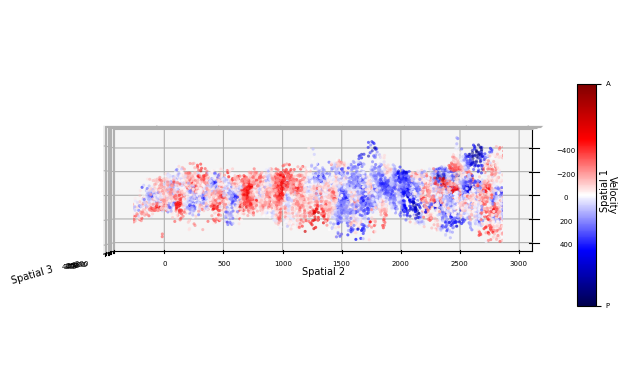

In [76]:
max_mag = int(np.abs(adata.obs['v_ap']).max())
tpv.plotting.plot_3d_heatmap(adata.obs['v_ap'].to_numpy(),
                             x_trans,
                             angle=(90, 0),
                             colorbar_name='Velocity',
                             colorbar_limits=[-max_mag, max_mag],
                             colorbar_ticklabels=['P', 'A'],
                             markersize=5,
                             cmap='seismic',
                             axis_off=False,
                             real_aspect_ratio=True,
                             zoom=1.2,
                             colorbar_pos=[1.2, 0.2, 0.05, 0.6])


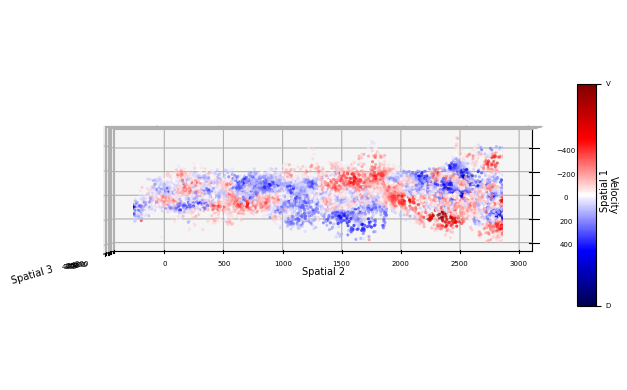

In [77]:
max_mag = int(np.abs(adata.obs['v_dv']).max())
tpv.plotting.plot_3d_heatmap(adata.obs['v_dv'].to_numpy(),
                             x_trans,
                             angle=(90, 0),
                             colorbar_name='Velocity',
                             colorbar_limits=[-max_mag, max_mag],
                             colorbar_ticklabels=['D', 'V'],
                             markersize=5,
                             cmap='seismic',
                             axis_off=False,
                             real_aspect_ratio=True,
                             zoom=1.2,
                             colorbar_pos=[1.2, 0.2, 0.05, 0.6])

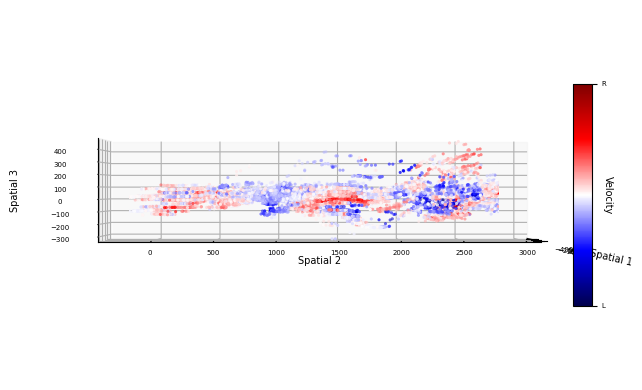

In [78]:
max_mag = int(np.abs(adata.obs['v_rl']).max())
tpv.plotting.plot_3d_heatmap(adata.obs['v_rl'].to_numpy(),
                             x_trans,
                             angle=(0, 0),
                             colorbar_name='Velocity',
                             colorbar_limits=[-max_mag, max_mag],
                             colorbar_ticklabels=['L', 'R'],
                             markersize=5,
                             cmap='seismic',
                             axis_off=False,
                             real_aspect_ratio=True,
                             zoom=1.2,
                             colorbar_pos=[1.2, 0.2, 0.05, 0.6])

## 5.6 Calculate divergence along A-P axis

In [79]:
from scipy.ndimage import gaussian_filter
def div_1d(coord, v, window, step):
    n = len(coord)
    ind = np.argsort(coord)
    coord = coord[ind]
    v = v[ind]
    MAX_COORD = coord[-1]
    
    l, r = 0, 0  # left and right index of the window
    start, end = coord[l], coord[r]
    div = []  # records divergence along an axis
    s = 0  # current velocity sum (proportional to divergence)
    pos = []
    while l < n:
        # Find the right margin
        while r < n and end < start + window:
            s += v[r]
            r += 1
            if r < n:
                end = coord[r]
        div.append(s / (r - l))
        pos.append((start + end)/2)
        
        # Update the left margin
        next_start = coord[l]
        while l < n and next_start < start + step: 
            s -= v[l]
            l += 1
            if l < n:
                next_start = coord[l]
        start = next_start
    
    # Gaussian Filtering for visualization
    div = gaussian_filter(div, sigma=window * 0.25)
    return pos[:-1], np.diff(div)

In [80]:
coord_ap = -adata.obsm['X_tube'][:, 1] * 0.647
v_ap = -adata.obs['v_ap'].to_numpy()
window = 30
step = 10
pos, div_ap = div_1d(coord_ap, v_ap, window, step)

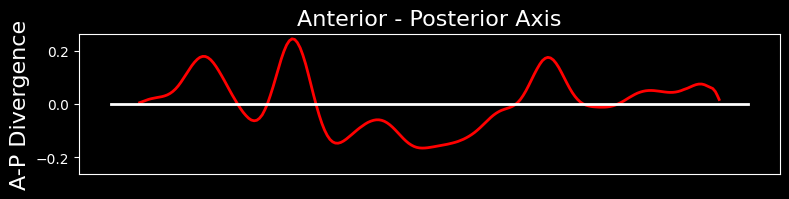

In [81]:
fig = plt.figure(figsize=(8, 2))
# Add subplot
ax = plt.gca()  # Get the current Axes instance

# Set background color to black
fig.patch.set_facecolor('black')  # Background of the figure
ax.set_facecolor('black')         # Background of the plot

limit = np.max(np.abs(div_ap))
plt.plot(pos, div_ap, color='red', linewidth=2.0)
plt.ylim(-limit-0.02, limit+0.02)
plt.plot(list(plt.xlim()), [0, 0], 'w-', linewidth=2.0)
plt.ylabel('A-P Divergence', fontsize=16, color='white')
plt.title('Anterior - Posterior Axis', fontsize=16, color='white')
plt.tight_layout()
ax.tick_params(axis='x', colors='white')  # X-axis ticks
ax.tick_params(axis='y', colors='white')  # Y-axis ticks
ax.set_xticks([])  # Remove x-ticks
# Customize the spines
for spine in ax.spines.values():
    spine.set_edgecolor('white')
plt.tight_layout()
plt.show()


In [26]:
df = pd.DataFrame()
df['pos_ap'] = pos
df['div_ap'] = div_ap
df.to_csv('div.csv')